Object Detection with YOLO

Tutorial Aim

The goal of this tutorial is to introduce you to object detection using the YOLO (You Only Look Once) v5 algorithm. We will also be using the Pascal VOC dataset. This tutorial focuses on:

1. Setting up YOLOv5 for object detection tasks.
2. Preparing and formatting the Pascal VOC 2012 dataset for training.
3. Training YOLOv5 on Pascal VOC 2012 data.
4. Evaluating the trained model and visualizing detection results.

This tutorial is designed to:
- **Teach foundational concepts** of YOLO-based object detection.
- **Provide hands-on practice** with data preprocessing, training, and evaluation.

It is important to ensure that you connect your environment to a GPU (if available) before starting, as training YOLOv5 on a CPU will be significantly slower. In Google Colab, go to `Runtime > Change Runtime Type` and set the hardware accelerator to GPU.

Part 1: Setup Environment and Load Dataset

In [ ]:
#Import neccesary packages
import os
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
import xml.etree.ElementTree as ET
import random
from IPython.display import Image, display

In [1]:
## Step 1: Setup Environment
# Clone YOLOv5 Repository and Install Dependencies

!git clone https://github.com/joshmoy/yolov5.git
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17083, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 17083 (delta 33), reused 40 (delta 19), pack-reused 17022 (from 1)
Receiving objects: 100% (17083/17083), 15.71 MiB | 7.61 MiB/s, done.
Resolving deltas: 100% (11728/11728), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 25.0 MB/s eta 0:00:00


In [2]:
## Step 2: Download Pascal VOC Dataset
# Download and Extract the Dataset

!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
# !rm -rf VOCdevkit
!mkdir -p VOCdevkit

# The --strip-components=1 flag removes the first directory level, preventing the extra nesting.
!tar -xvf VOCtrainval_11-May-2012.tar -C VOCdevkit --strip-components=1


Streaming output truncated to the last 5000 lines.
VOCdevkit/VOC2012/SegmentationClass/2008_001874.png
VOCdevkit/VOC2012/SegmentationClass/2008_001876.png
VOCdevkit/VOC2012/SegmentationClass/2008_001882.png
VOCdevkit/VOC2012/SegmentationClass/2008_001885.png
VOCdevkit/VOC2012/SegmentationClass/2008_001895.png
VOCdevkit/VOC2012/SegmentationClass/2008_001896.png
VOCdevkit/VOC2012/SegmentationClass/2008_001926.png
VOCdevkit/VOC2012/SegmentationClass/2008_001966.png
VOCdevkit/VOC2012/SegmentationClass/2008_001971.png
VOCdevkit/VOC2012/SegmentationClass/2008_001992.png
VOCdevkit/VOC2012/SegmentationClass/2008_001997.png
VOCdevkit/VOC2012/SegmentationClass/2008_002032.png
VOCdevkit/VOC2012/SegmentationClass/2008_002043.png
VOCdevkit/VOC2012/SegmentationClass/2008_002064.png
VOCdevkit/VOC2012/SegmentationClass/2008_002066.png
VOCdevkit/VOC2012/SegmentationClass/2008_002067.png
VOCdevkit/VOC2012/SegmentationClass/2008_002073.png
VOCdevkit/VOC2012/SegmentationClass/2008_002079.png
VOCdevkit/VOC

Now it's time to explore the VOC dataset.

In [19]:
# Inspect directory structure
print("Dataset Structure:")
print(os.listdir("VOCdevkit/VOC2012"))
print(f"Number of images: {len(image_paths)}")

Dataset Structure:
['ImageSets', 'SegmentationClass', 'Annotations', 'JPEGImages', 'labels', 'SegmentationObject']
Number of images: 17125


Dataset Structure:
['ImageSets', 'SegmentationClass', 'Annotations', 'JPEGImages', 'SegmentationObject']
Number of images: 17125


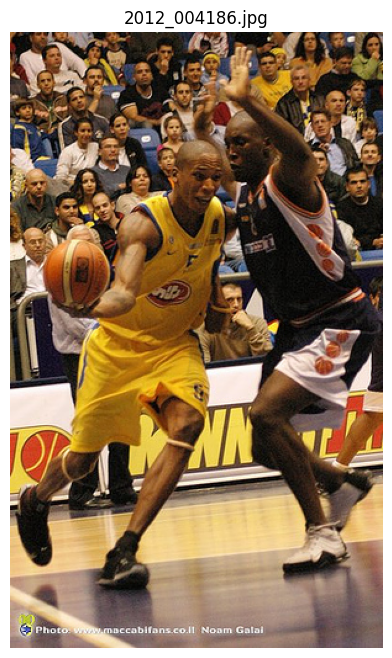

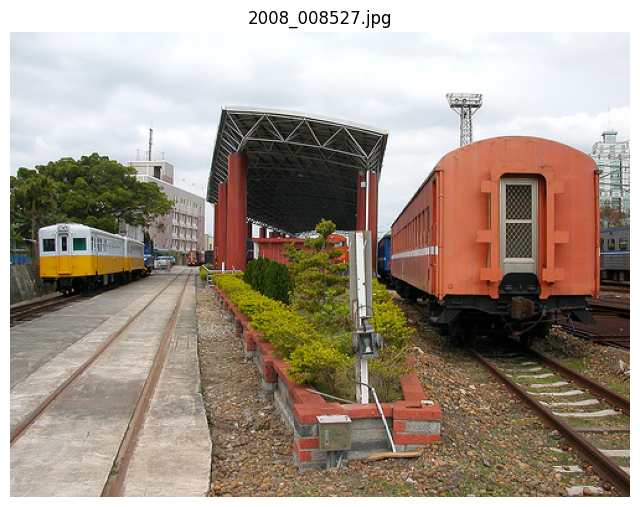

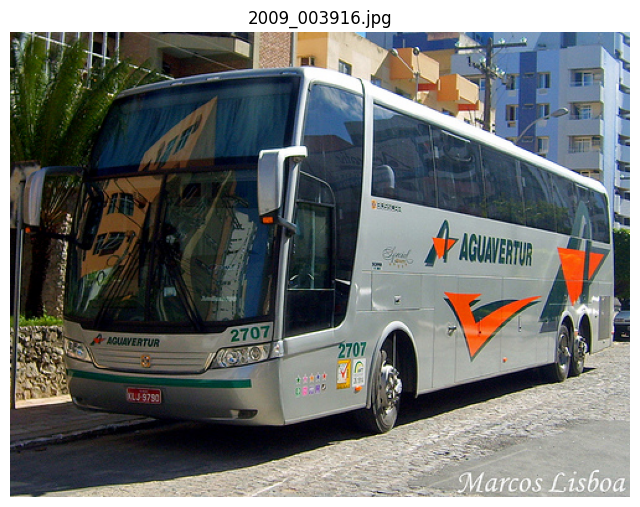

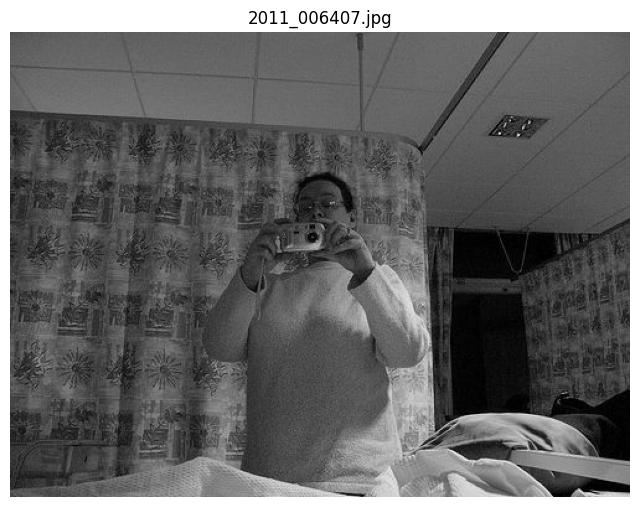

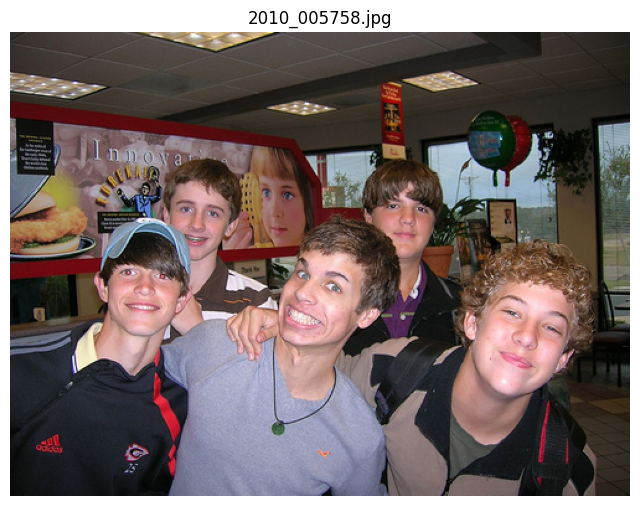

Objects in the image:
 - person: (174, 101, 349, 351)


In [3]:
## Step 3: Explore the Dataset
# Display sample images
image_paths = glob.glob("VOCdevkit/VOC2012/JPEGImages/*.jpg")

random_indices = np.random.choice(len(image_paths), 5, replace=False)  # Select 5 unique random indices
random_images = [image_paths[i] for i in random_indices]  # Get corresponding file paths

for img_path in random_images:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(os.path.basename(img_path))
    plt.show()

In [20]:
# Inspect a sample annotation
sample_annotation = "VOCdevkit/VOC2012/Annotations/2007_000027.xml"
if os.path.exists(sample_annotation):
    tree = ET.parse(sample_annotation)
    root = tree.getroot()

    print("Objects in the image:")
    for obj in root.findall("object"):
        name = obj.find("name").text
        bndbox = obj.find("bndbox")
        xmin = bndbox.find("xmin").text
        ymin = bndbox.find("ymin").text
        xmax = bndbox.find("xmax").text
        ymax = bndbox.find("ymax").text
        print(f" - {name}: ({xmin}, {ymin}, {xmax}, {ymax})")
else:
    print("Sample annotation file not found.")

Objects in the image:
 - person: (174, 101, 349, 351)


Part 2: Preparing and formatting the Pascal VOC 2012 dataset for training.

We need to convert the annotations to YOLO format because YOLO requires each annotation to be in a .txt file with the following structure:



```
<class_id> <x_center> <y_center> <width> <height>
```



In [5]:
# This function converts voc files to yolo format
def convert_voc_to_yolo(xml_file, output_file, classes):
    """
    Convert a single Pascal VOC annotation file to YOLO format.

    Args:
    - xml_file (str): Path to the VOC annotation XML file.
    - output_file (str): Path to the output YOLO annotation TXT file.
    - classes (list): List of class names corresponding to the dataset.

    Returns:
    - None: Writes the YOLO annotation to the output file.
    """

    # Parse the XML file
    tree = ET.parse(xml_file)
    root = tree.getroot()

    with open(output_file, "w") as f:
        for obj in root.findall("object"):
            class_name = obj.find("name").text
            if class_name not in classes:
                continue
            class_id = classes.index(class_name)

            bndbox = obj.find("bndbox")
            x_min = float(bndbox.find("xmin").text)
            y_min = float(bndbox.find("ymin").text)
            x_max = float(bndbox.find("xmax").text)
            y_max = float(bndbox.find("ymax").text)

            width = float(root.find("size/width").text)
            height = float(root.find("size/height").text)

            x_center = (x_min + x_max) / 2.0 / width
            y_center = (y_min + y_max) / 2.0 / height
            w = (x_max - x_min) / width
            h = (y_max - y_min) / height

            f.write(f"{class_id} {x_center} {y_center} {w} {h}\n")

These new .txt formats will be stored in the `VOCdevkit/VOC2012/labels` directory

In [ ]:
# Classes in Pascal VOC
classes = ["aeroplane", "bicycle", "bird", "boat", "bottle",
           "bus", "car", "cat", "chair", "cow", "diningtable",
           "dog", "horse", "motorbike", "person", "pottedplant",
           "sheep", "sofa", "train", "tvmonitor"]

# Convert all annotations
xml_dir = "VOCdevkit/VOC2012/Annotations"
output_dir = "VOCdevkit/VOC2012/labels"
os.makedirs(output_dir, exist_ok=True)

# Convert each XML file to YOLO format
for xml_file in os.listdir(xml_dir):
    if xml_file.endswith(".xml"):
        convert_voc_to_yolo(
            os.path.join(xml_dir, xml_file),
            os.path.join(output_dir, xml_file.replace(".xml", ".txt")),
            classes
        )

Next, we have to split the dataset into training and validation images. The training set is used to train the model while the validation set is used to evaluate the model's performance.

In [6]:
# Step 5: Create Dataset Splits

# Get all image paths
image_paths = glob.glob("VOCdevkit/VOC2012/JPEGImages/*.jpg")

# Shuffle and split data
random.shuffle(image_paths)
train_split = int(0.8 * len(image_paths))
train_images = image_paths[:train_split]
val_images = image_paths[train_split:]

# Save to files
with open("/content/yolov5/train.txt", "w") as train_file:
    train_file.write("\n".join(train_images))

with open("/content/yolov5/val.txt", "w") as val_file:
    val_file.write("\n".join(val_images))


Let's inspect our training and validation images

In [8]:
print(f"Total images: {len(image_paths)}")
print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")

Total images: 17125
Training images: 13700
Validation images: 3425


We will create a .yaml file to configure the dataset for YOLOv5 training. This file that tells YOLOv5 where to find the training and validation data, the number of classes, and the class names.

In [7]:
## Step 6: Configure YOLOv5 for Pascal VOC
voc_yaml = """
train: /content/yolov5/train.txt
val: /content/yolov5/val.txt

nc: 20  # number of classes
names: ["aeroplane", "bicycle", "bird", "boat", "bottle",
        "bus", "car", "cat", "chair", "cow", "diningtable",
        "dog", "horse", "motorbike", "person", "pottedplant",
        "sheep", "sofa", "train", "tvmonitor"]
"""
with open("data/voc.yaml", "w") as f:
    f.write(voc_yaml)


Before we train the model, we have to verify that all the images have corresponding labels.

In [9]:
def verify_labels(image_paths, labels_dir):
    missing_labels = []
    for img_path in image_paths:
        label_path = os.path.join(labels_dir, os.path.basename(img_path).replace('.jpg', '.txt'))
        if not os.path.exists(label_path):
            missing_labels.append(img_path)

    if missing_labels:
        print(f"Warning: {len(missing_labels)} images are missing label files")
        print("First few missing label paths:", missing_labels[:5])
    else:
        print("All images have corresponding label files")

# Verify labels for both train and val sets
verify_labels(train_images, "VOCdevkit/VOC2012/labels")
verify_labels(val_images, "VOCdevkit/VOC2012/labels")

All images have corresponding label files
All images have corresponding label files


Part 3: Training YOLOv5 on Pascal VOC 2012 data.

We will train the model for 10 epochs (due to GPU restraints) using images resized to 640x640 pixels, with a batch size of 16, and the dataset specified in data/voc.yaml. The --cache ram option preloads the dataset into RAM for faster training. For better results, the model could be trained for up to 50 epochs.

Note: This training might take some time to complete.

In [23]:
## Step 7: Train YOLOv5 on Pascal VOC
!python train.py --img 640 --batch 16 --epochs 10 --data data/voc.yaml --weights yolov5s.pt --cache ram

Streaming output truncated to the last 5000 lines.
        7/9       5.6G    0.03994    0.03154    0.01673         82        640:  11% 93/857 [00:47<05:28,  2.33it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        7/9       5.6G    0.03993    0.03168    0.01669        114        640:  11% 94/857 [00:47<05:19,  2.39it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        7/9       5.6G    0.03997    0.03174    0.01671         94        640:  11% 95/857 [00:47<04:54,  2.59it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        7/9       5.6G    0.03994 

Part 4: Evaluating the trained model and visualizing detection results.

We will run inference using the trained YOLOv5 model (best.pt) on images from the VOCdevkit/VOC2012/JPEGImages/ directory, resizing them to 640x640 pixels. Detections are shown for objects with confidence scores of 50% or higher (--conf 0.5).

In [24]:
# Perform Inference
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.5 --source VOCdevkit/VOC2012/JPEGImages/

Streaming output truncated to the last 5000 lines.
image 12128/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001592.jpg: 480x640 1 boat, 9.0ms
image 12129/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001594.jpg: 448x640 1 person, 6.0ms
image 12130/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001596.jpg: 480x640 2 cars, 6.0ms
image 12131/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001597.jpg: 640x448 (no detections), 5.7ms
image 12132/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001599.jpg: 480x640 (no detections), 6.0ms
image 12133/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001600.jpg: 480x640 2 chairs, 1 pottedplant, 5.8ms
image 12134/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001601.jpg: 480x640 1 cat, 5.9ms
image 12135/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001602.jpg: 480x640 1 person, 1 train, 5.8ms
image 12136/17125 /content/yolov5/VOCdevkit/VOC2012/JPEGImages/2011_001605.jpg: 448x64

Now we can view the training results from YOLOv5 below.

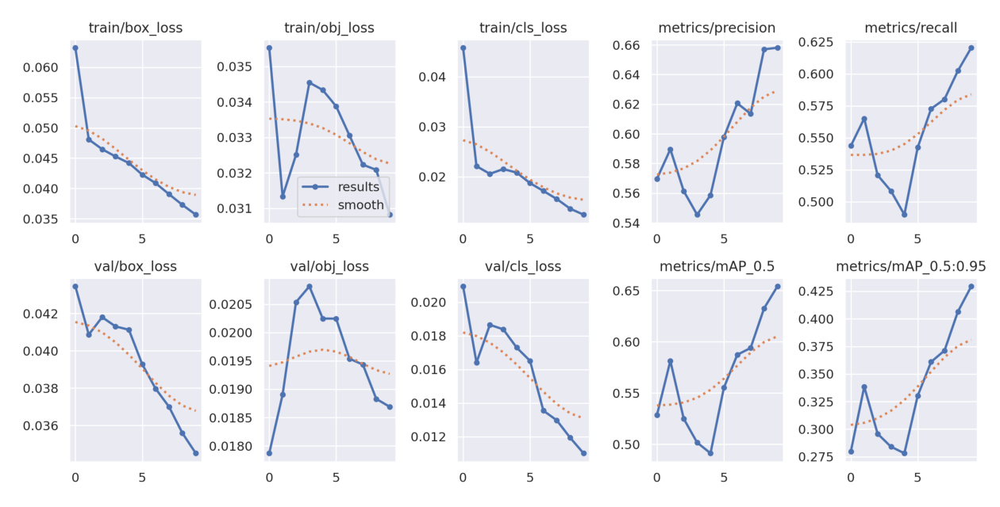

In [27]:
# Display Training Results
results_path = "runs/train/exp/results.png"  # YOLOv5 saves a results plot
if os.path.exists(results_path):
    img = plt.imread(results_path)
    plt.figure(figsize=(16, 12))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

We can also view the detection results

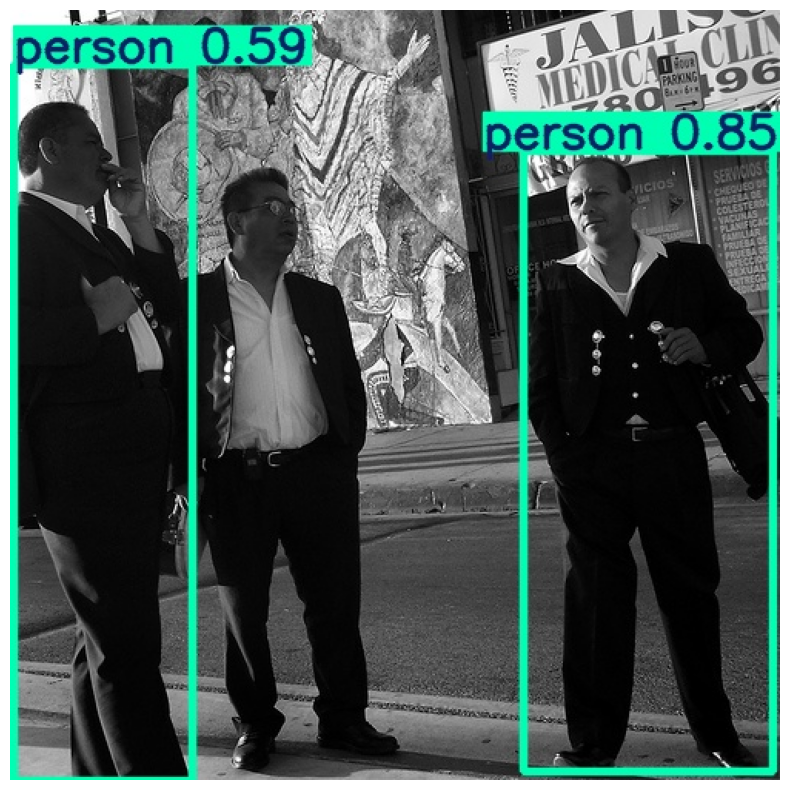

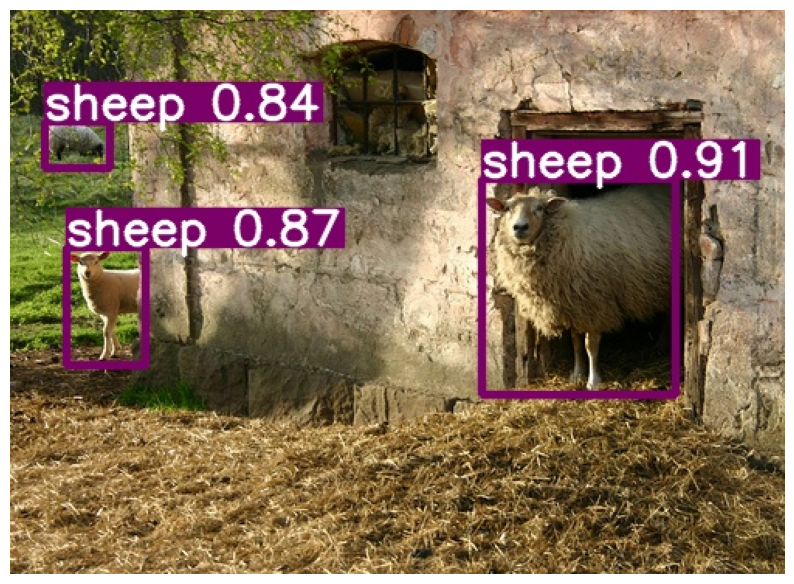

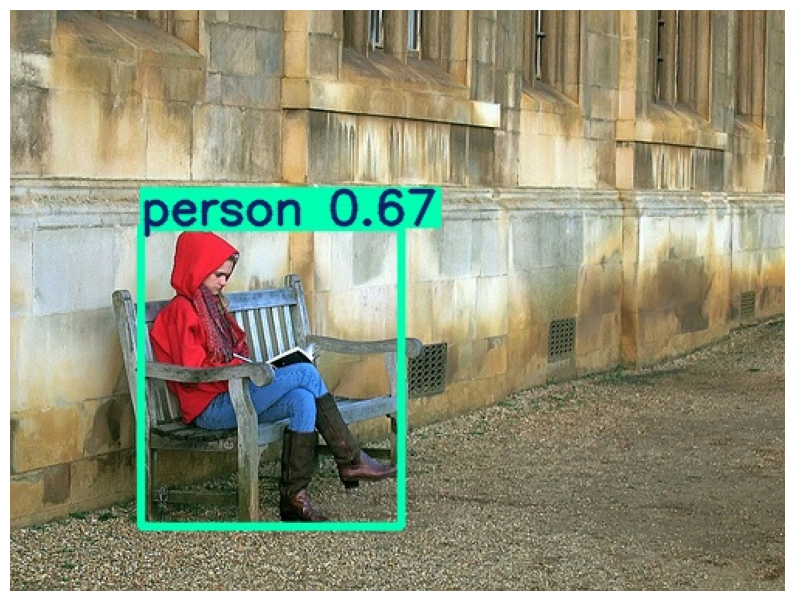

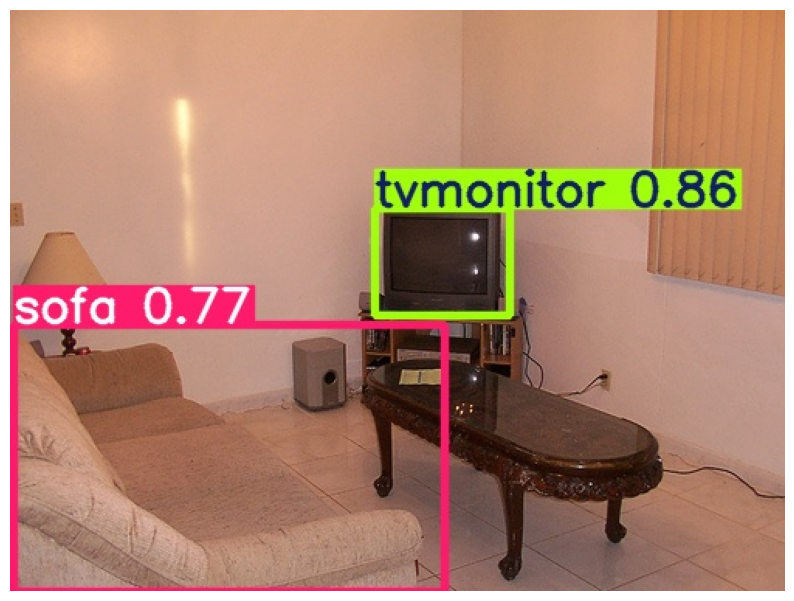

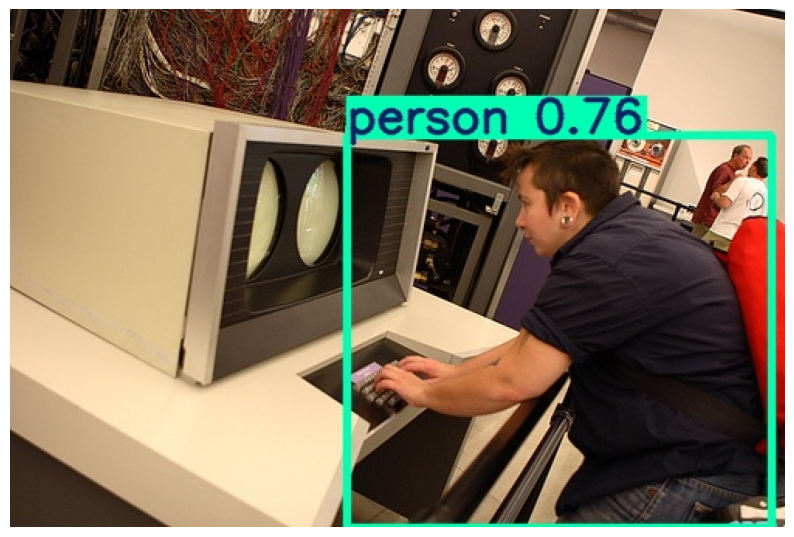

In [28]:
# Display 5 Random Detection Results
result_images = glob.glob("runs/detect/exp/*.jpg")
random_results = random.sample(result_images, min(5, len(result_images)))

for img_path in random_results:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

We can view the confusion matrix showing true positives, false positives, and false negatives for each class.

In [32]:
!python val.py --weights runs/train/exp/weights/best.pt --data data/voc.yaml --imgsz 640 --conf-thres 0.001

val: data=data/voc.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-391-g2d8e3a47 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /content/yolov5/val.cache... 3425 images, 0 backgrounds, 0 corrupt: 100% 3425/3425 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 108/108 [00:46<00:00,  2.34it/s]
                   all       3425       7816      0.661      0.619      0.654      0.429
             aeroplane       3425        186       0.84      0.762      0.838      0.525
               bicycle       3425        174  

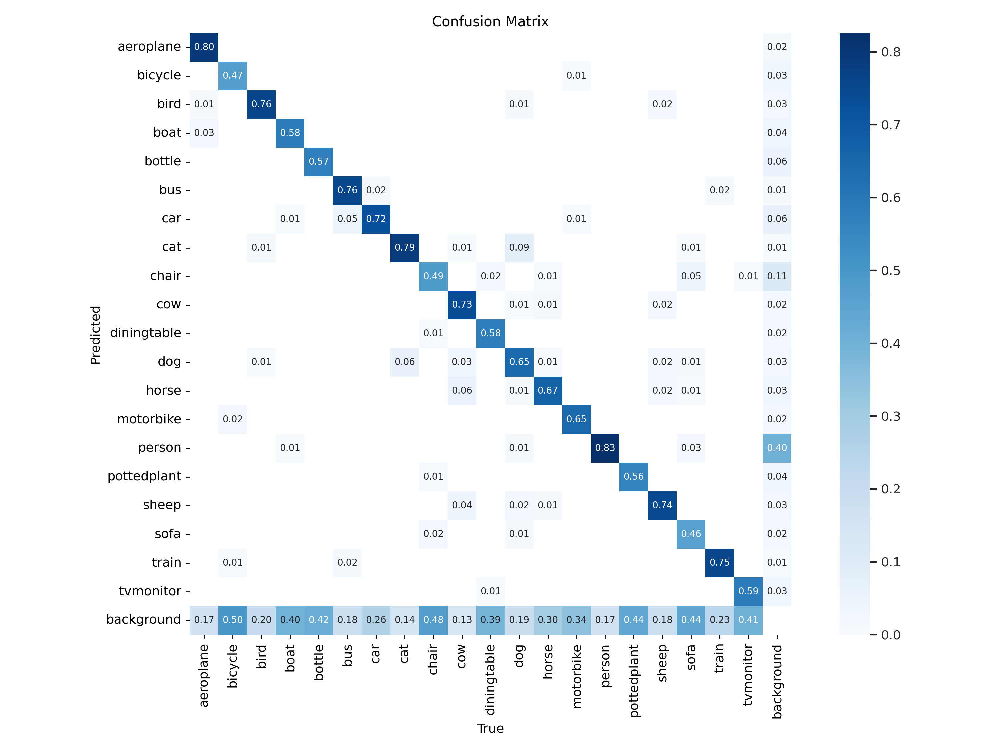

In [33]:
confusion_matrix_path = "runs/val/exp/confusion_matrix.png"
display(Image(filename=confusion_matrix_path))


Now it's time to evaluate our model by testing with an image of choice. I'd be using this [image of a dog and a cat from google](https://stpaulpet.com/wp-content/uploads/dog-facts-cat-facts.jpg). You can use any image of your choice, just be sure to update the file name when making inference. Let's see how well our model performs.

In [34]:
from google.colab import files

# Upload an image file
uploaded = files.upload()

# Display the uploaded file name
for file_name in uploaded.keys():
    print(f"Uploaded file: {file_name}")


Saving test_image.webp to test_image.webp
Uploaded file: test_image.webp


In [35]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source test_image.webp


detect: weights=['runs/train/exp/weights/best.pt'], source=test_image.webp, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-391-g2d8e3a47 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/yolov5/test_image.webp: 480x640 2 dogs, 29.4ms
Speed: 0.5ms pre-process, 29.4ms inference, 495.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2
